# Lab 5 - BCC406

## REDES NEURAIS E APRENDIZAGEM EM PROFUNDIDADE

## ConvNets para classificação e localização

### Prof. Eduardo e Prof. Pedro

### Aluna: Daniela Costa Terra

Objetivos:

- Parte I : Detecção de objetos

- Parte II : Segmentação de imagens na [Oxford Pet Dataset](https://www.robots.ox.ac.uk/~vgg/data/pets/)

Data da entrega : --/-- 

- Complete o código (marcado com ToDo) e quando requisitado, escreva textos diretamente nos notebooks. Onde tiver *None*, substitua pelo seu código.
- Execute todo notebook e salve tudo em um PDF **nomeado** como "NomeSobrenome-Lab4.pdf"
- Envie o PDF via google [FORM](https://forms.gle/Mh9NvBWTKG8ts4gY6)

Este notebook é baseado em tensorflow e Keras.



 # Importações e funções:
 
 https://colab.research.google.com/github/tensorflow/hub/blob/master/examples/colab/tf2_object_detection.ipynb#scrollTo=5mucYUS6exUJ

In [ ]:
# This Colab requires TF 2.5.
!pip install -U "tensorflow>=2.5"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import os
import pathlib

import matplotlib
import matplotlib.pyplot as plt

import io
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from six.moves.urllib.request import urlopen

import tensorflow as tf
import tensorflow_hub as hub

tf.get_logger().setLevel('ERROR')

In [ ]:
#@title Run this!! { form-width: "30px" }

def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  image = None
  if(path.startswith('http')):
    response = urlopen(path)
    image_data = response.read()
    image_data = BytesIO(image_data)
    image = Image.open(image_data)
  else:
    image_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(image_data))

  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (1, im_height, im_width, 3)).astype(np.uint8)


ALL_MODELS = {
'CenterNet HourGlass104 512x512' : 'https://tfhub.dev/tensorflow/centernet/hourglass_512x512/1',
'CenterNet HourGlass104 Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/hourglass_512x512_kpts/1',
'CenterNet HourGlass104 1024x1024' : 'https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024/1',
'CenterNet HourGlass104 Keypoints 1024x1024' : 'https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024_kpts/1',
'CenterNet Resnet50 V1 FPN 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn_512x512/1',
'CenterNet Resnet50 V1 FPN Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn_512x512_kpts/1',
'CenterNet Resnet101 V1 FPN 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet101v1_fpn_512x512/1',
'CenterNet Resnet50 V2 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512/1',
'CenterNet Resnet50 V2 Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512_kpts/1',
'EfficientDet D0 512x512' : 'https://tfhub.dev/tensorflow/efficientdet/d0/1',
'EfficientDet D1 640x640' : 'https://tfhub.dev/tensorflow/efficientdet/d1/1',
'EfficientDet D2 768x768' : 'https://tfhub.dev/tensorflow/efficientdet/d2/1',
'EfficientDet D3 896x896' : 'https://tfhub.dev/tensorflow/efficientdet/d3/1',
'EfficientDet D4 1024x1024' : 'https://tfhub.dev/tensorflow/efficientdet/d4/1',
'EfficientDet D5 1280x1280' : 'https://tfhub.dev/tensorflow/efficientdet/d5/1',
'EfficientDet D6 1280x1280' : 'https://tfhub.dev/tensorflow/efficientdet/d6/1',
'EfficientDet D7 1536x1536' : 'https://tfhub.dev/tensorflow/efficientdet/d7/1',
'SSD MobileNet v2 320x320' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/2',
'SSD MobileNet V1 FPN 640x640' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v1/fpn_640x640/1',
'SSD MobileNet V2 FPNLite 320x320' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_320x320/1',
'SSD MobileNet V2 FPNLite 640x640' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_640x640/1',
'SSD ResNet50 V1 FPN 640x640 (RetinaNet50)' : 'https://tfhub.dev/tensorflow/retinanet/resnet50_v1_fpn_640x640/1',
'SSD ResNet50 V1 FPN 1024x1024 (RetinaNet50)' : 'https://tfhub.dev/tensorflow/retinanet/resnet50_v1_fpn_1024x1024/1',
'SSD ResNet101 V1 FPN 640x640 (RetinaNet101)' : 'https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_640x640/1',
'SSD ResNet101 V1 FPN 1024x1024 (RetinaNet101)' : 'https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_1024x1024/1',
'SSD ResNet152 V1 FPN 640x640 (RetinaNet152)' : 'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_640x640/1',
'SSD ResNet152 V1 FPN 1024x1024 (RetinaNet152)' : 'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_1024x1024/1',
'Faster R-CNN ResNet50 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_640x640/1',
'Faster R-CNN ResNet50 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_1024x1024/1',
'Faster R-CNN ResNet50 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_800x1333/1',
'Faster R-CNN ResNet101 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_640x640/1',
'Faster R-CNN ResNet101 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_1024x1024/1',
'Faster R-CNN ResNet101 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_800x1333/1',
'Faster R-CNN ResNet152 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_640x640/1',
'Faster R-CNN ResNet152 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_1024x1024/1',
'Faster R-CNN ResNet152 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_800x1333/1',
'Faster R-CNN Inception ResNet V2 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_640x640/1',
'Faster R-CNN Inception ResNet V2 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_1024x1024/1',
'Mask R-CNN Inception ResNet V2 1024x1024' : 'https://tfhub.dev/tensorflow/mask_rcnn/inception_resnet_v2_1024x1024/1'
}

IMAGES_FOR_TEST = {
  'Beach' : 'models/research/object_detection/test_images/image2.jpg',
  'Dogs' : 'models/research/object_detection/test_images/image1.jpg',
  # By Heiko Gorski, Source: https://commons.wikimedia.org/wiki/File:Naxos_Taverna.jpg
  'Naxos Taverna' : 'https://upload.wikimedia.org/wikipedia/commons/6/60/Naxos_Taverna.jpg',
  # Source: https://commons.wikimedia.org/wiki/File:The_Coleoptera_of_the_British_islands_(Plate_125)_(8592917784).jpg
  'Beatles' : 'https://upload.wikimedia.org/wikipedia/commons/1/1b/The_Coleoptera_of_the_British_islands_%28Plate_125%29_%288592917784%29.jpg',
  # By Américo Toledano, Source: https://commons.wikimedia.org/wiki/File:Biblioteca_Maim%C3%B3nides,_Campus_Universitario_de_Rabanales_007.jpg
  'Phones' : 'https://upload.wikimedia.org/wikipedia/commons/thumb/0/0d/Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg/1024px-Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg',
  # Source: https://commons.wikimedia.org/wiki/File:The_smaller_British_birds_(8053836633).jpg
  'Birds' : 'https://upload.wikimedia.org/wikipedia/commons/0/09/The_smaller_British_birds_%288053836633%29.jpg',
}

COCO17_HUMAN_POSE_KEYPOINTS = [(0, 1),
 (0, 2),
 (1, 3),
 (2, 4),
 (0, 5),
 (0, 6),
 (5, 7),
 (7, 9),
 (6, 8),
 (8, 10),
 (5, 6),
 (5, 11),
 (6, 12),
 (11, 12),
 (11, 13),
 (13, 15),
 (12, 14),
 (14, 16)]

In [ ]:
# Clone the tensorflow models repository
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 3391, done.
remote: Counting objects: 100% (3391/3391), done.
remote: Compressing objects: 100% (2815/2815), done.
remote: Total 3391 (delta 895), reused 1380 (delta 521), pack-reused 0
Receiving objects: 100% (3391/3391), 34.93 MiB | 28.18 MiB/s, done.
Resolving deltas: 100% (895/895), done.


In [ ]:
%%bash
sudo apt install -y protobuf-compiler
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Reading package lists...
Building dependency tree...
Reading state information...
protobuf-compiler is already the newest version (3.0.0-9.1ubuntu1).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1693282 sha256=dac39caf30dafa2ac42d19800021e5227036cc2e5e7245ff9334ed30bf95a246
  Stored in directory: /tmp/pip-ephem-wheel-cache-nf4rst2s/wheels/fa/a4/d2/e9a5057e414fd46c8e543d2706cd836d64e1fcd9eccceb2329
  Created wheel for py-cpuinfo: filename=py_cpuinfo-8.0.0-py3-none-any.whl size=22257 sha256=93c8a0b403bc8a091a5b848937f2afdd216fc816396e612dce66e4e77dd3a184
  Stored in directory: /root/.cache/pip/wheels/d2/f1/1f/0



  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
multiprocess 0.70.13 requires dill>=0.3.5.1, but you have dill 0.3.1.1 which is incompatible.
gym 0.17.3 requires cloudpickle<1.7.0,>=1.2.0, but you have cloudpickle 2.1.0 which is incompatible.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.28.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.

In [ ]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import ops as utils_ops

%matplotlib inline

In [ ]:
PATH_TO_LABELS = './models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

# Parte I - Detecção de Objetos (60pt)




Execute o tutorial do [link](https://colab.research.google.com/github/tensorflow/hub/blob/master/examples/colab/tf2_object_detection.ipynb#scrollTo=IogyryF2lFBL). Faça um teste com os seguintes modelos:

- EfficientDet D0 512x512
- SSD MobileNet V2 FPNLite 320x320
- SSD ResNet50 V1 FPN 640x640 (RetinaNet50)
- Faster R-CNN ResNet50 V1 640x640
- Mask R-CNN Inception ResNet V2 1024x1024

Teste com imagens de:

- Praia
- Cachorros
- Pássartos


 # Testes
 - carregando imagens

In [ ]:
#@title Image Selection (don't forget to execute the cell!) { display-mode: "form"}
selected_image = 'Beach' # @param ['Beach', 'Dogs', 'Naxos Taverna', 'Beatles', 'Phones', 'Birds']
flip_image_horizontally = False #@param {type:"boolean"}
convert_image_to_grayscale = False #@param {type:"boolean"}

image_path = IMAGES_FOR_TEST[selected_image]
image1_np = load_image_into_numpy_array(image_path)

# Flip horizontally
if(flip_image_horizontally):
  image1_np[0] = np.fliplr(image1_np[0]).copy()

# Convert image to grayscale
if(convert_image_to_grayscale):
  image1_np[0] = np.tile(
    np.mean(image1_np[0], 2, keepdims=True), (1, 1, 3)).astype(np.uint8)


In [ ]:
#@title Image Selection (don't forget to execute the cell!) { display-mode: "form"}
selected_image = 'Dogs' # @param ['Beach', 'Dogs', 'Naxos Taverna', 'Beatles', 'Phones', 'Birds']
flip_image_horizontally = False #@param {type:"boolean"}
convert_image_to_grayscale = False #@param {type:"boolean"}

image_path = IMAGES_FOR_TEST[selected_image]
image2_np = load_image_into_numpy_array(image_path)

# Flip horizontally
if(flip_image_horizontally):
  image2_np[0] = np.fliplr(image2_np[0]).copy()

# Convert image to grayscale
if(convert_image_to_grayscale):
  image2_np[0] = np.tile(
    np.mean(image2_np[0], 2, keepdims=True), (1, 1, 3)).astype(np.uint8)


In [ ]:
#@title Image Selection (don't forget to execute the cell!) { display-mode: "form"}
selected_image = 'Birds' # @param ['Beach', 'Dogs', 'Naxos Taverna', 'Beatles', 'Phones', 'Birds']
flip_image_horizontally = False #@param {type:"boolean"}
convert_image_to_grayscale = False #@param {type:"boolean"}

image_path = IMAGES_FOR_TEST[selected_image]
image3_np = load_image_into_numpy_array(image_path)

# Flip horizontally
if(flip_image_horizontally):
  image3_np[0] = np.fliplr(image3_np[0]).copy()

# Convert image to grayscale
if(convert_image_to_grayscale):
  image3_np[0] = np.tile(
    np.mean(image3_np[0], 2, keepdims=True), (1, 1, 3)).astype(np.uint8)


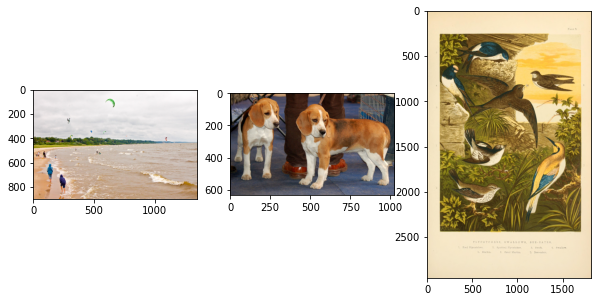

In [ ]:
fig, (ax0, ax1, ax2) = plt.subplots(ncols=3, figsize=(10, 5))
ax0.imshow(image1_np[0])
ax1.imshow(image2_np[0]);
ax2.imshow(image3_np[0])

plt.show()


In [ ]:
from PIL import Image
im = Image.fromarray(image1_np[0])
im.save("/content/gdrive/MyDrive/disciplinasDoutorado/PCC177-2022-1(Redes)/lab5/images/Beach.jpeg")
im = Image.fromarray(image2_np[0])
im.save("/content/gdrive/MyDrive/disciplinasDoutorado/PCC177-2022-1(Redes)/lab5/images/Dogs.jpeg")
im = Image.fromarray(image3_np[0])
im.save("/content/gdrive/MyDrive/disciplinasDoutorado/PCC177-2022-1(Redes)/lab5/images/Birds.jpeg")

- Carregando modelos:

In [ ]:

print('loading models...')
hub_model_EfficientDet = hub.load(ALL_MODELS['EfficientDet D0 512x512'])
hub_model_MobileNet = hub.load(ALL_MODELS['SSD MobileNet V2 FPNLite 320x320'])
hub_model_RetinaNet50 = hub.load(ALL_MODELS['SSD ResNet50 V1 FPN 640x640 (RetinaNet50)'])
hub_model_FasterRCNN = hub.load(ALL_MODELS['Faster R-CNN ResNet50 V1 640x640'])
hub_model_MaskRCNN = hub.load(ALL_MODELS['Mask R-CNN Inception ResNet V2 1024x1024'])

print('models loaded!')

loading models...


models loaded!


In [ ]:
import timeit

# running inference on models
results_EfficientDet = []
inicio = timeit.default_timer()
results_EfficientDet.append(hub_model_EfficientDet(image1_np)) 
results_EfficientDet.append(hub_model_EfficientDet(image2_np)) 
results_EfficientDet.append(hub_model_EfficientDet(image3_np)) 
fim = timeit.default_timer()
custo_EfficientDet = fim - inicio

results_MobileNet = []
inicio = timeit.default_timer()
results_MobileNet.append(hub_model_MobileNet(image1_np)) 
results_MobileNet.append(hub_model_MobileNet(image2_np)) 
results_MobileNet.append(hub_model_MobileNet(image3_np)) 
fim = timeit.default_timer()
custo_MobileNet = fim - inicio

results_RetinaNet50 = []
inicio = timeit.default_timer()
results_RetinaNet50.append(hub_model_RetinaNet50(image1_np)) 
results_RetinaNet50.append(hub_model_RetinaNet50(image2_np)) 
results_RetinaNet50.append(hub_model_RetinaNet50(image3_np)) 
fim = timeit.default_timer()
custo_RetinaNet50 = fim - inicio

results_FasterRCNN = []
inicio = timeit.default_timer()
results_FasterRCNN.append(hub_model_FasterRCNN(image1_np)) 
results_FasterRCNN.append(hub_model_FasterRCNN(image2_np)) 
results_FasterRCNN.append(hub_model_FasterRCNN(image3_np)) 
fim = timeit.default_timer()
custo_FasterRCNN = fim - inicio

results_MaskRCNN = []
inicio = timeit.default_timer()
results_MaskRCNN.append(hub_model_MaskRCNN(image1_np)) 
results_MaskRCNN.append(hub_model_MaskRCNN(image2_np)) 
results_MaskRCNN.append(hub_model_MaskRCNN(image3_np)) 
fim = timeit.default_timer()
custo_MaskRCNN = fim - inicio

In [ ]:
# Handle models with masks  
image_np_with_mask = [] 
image_np_with_mask.append(image1_np.copy())
image_np_with_mask.append(image2_np.copy())
image_np_with_mask.append(image3_np.copy())
label_id_offset = 0

def handle_models_with_masks_showResults(results_model, title):
  fig, axs = plt.subplots(ncols=3, figsize=(40, 15))
  fig.suptitle(title, fontsize=26); 
  for i in list(range(3)):
    results = results_model[i]
    result = {key:value.numpy() for key,value in results.items()}
    
    if 'detection_masks' in result:
      # we need to convert np.arrays to tensors
      detection_masks = tf.convert_to_tensor(result['detection_masks'][0])
      detection_boxes = tf.convert_to_tensor(result['detection_boxes'][0])

      # Reframe the bbox mask to the image size.
      detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
                detection_masks, detection_boxes,
                  image_np_with_mask[i].shape[1], image_np_with_mask[i].shape[2])
      detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                          tf.uint8)
      result['detection_masks_reframed'] = detection_masks_reframed.numpy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_mask[i][0],
          result['detection_boxes'][0],
          (result['detection_classes'][0] + label_id_offset).astype(int),
          result['detection_scores'][0],
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=200,
          min_score_thresh=.30,
          agnostic_mode=False,
          instance_masks=result.get('detection_masks_reframed', None),
          line_thickness=8)
    axs[i].imshow(image_np_with_mask[i][0]);
     
plt.show()
  
 

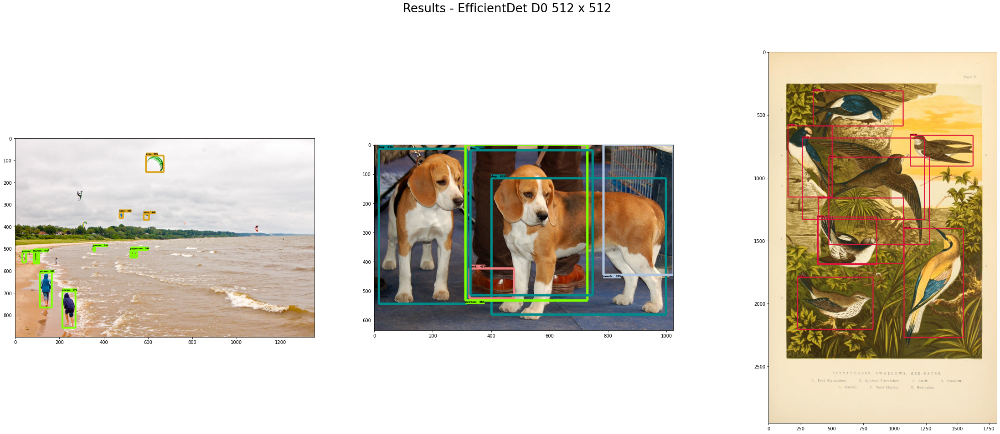

In [ ]:
# Show results - EfficientDet D0 512 x 512:
handle_models_with_masks_showResults(results_EfficientDet, 'Results - EfficientDet D0 512 x 512')

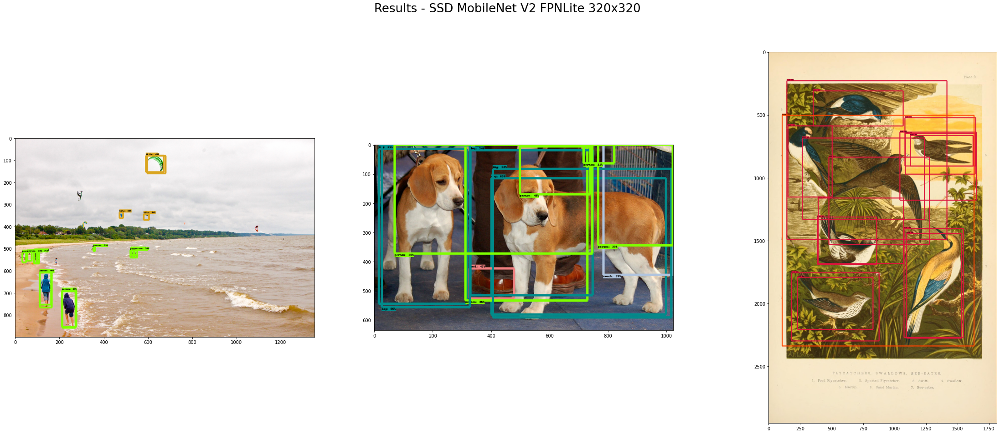

In [ ]:
# Show results - EfficientDet D0 512 x 512:
handle_models_with_masks_showResults(results_MobileNet, 'Results - SSD MobileNet V2 FPNLite 320x320')

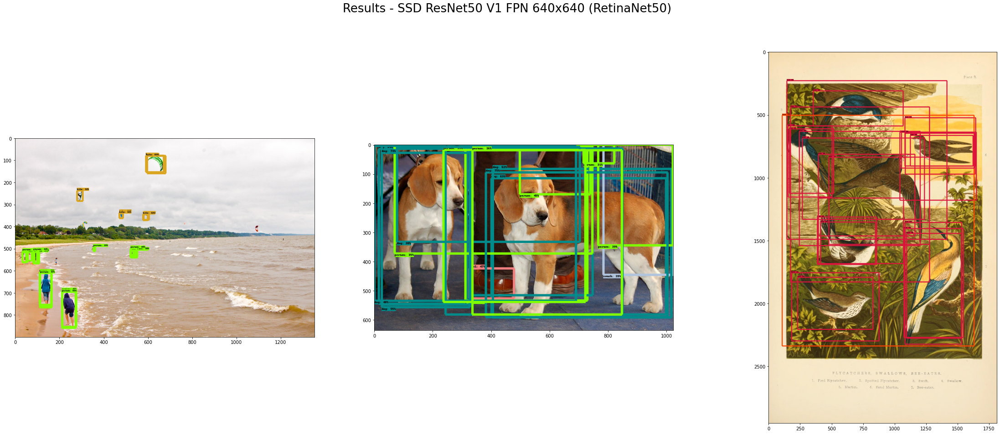

In [ ]:
# Show results - EfficientDet D0 512 x 512:
handle_models_with_masks_showResults(results_RetinaNet50, 'Results - SSD ResNet50 V1 FPN 640x640 (RetinaNet50)')

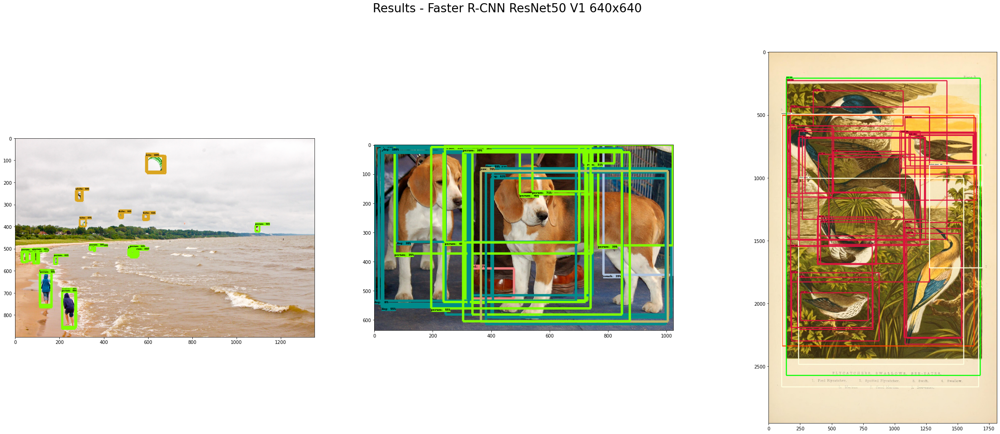

In [ ]:
# Show results - EfficientDet D0 512 x 512:

handle_models_with_masks_showResults(results_FasterRCNN, 'Results - Faster R-CNN ResNet50 V1 640x640')

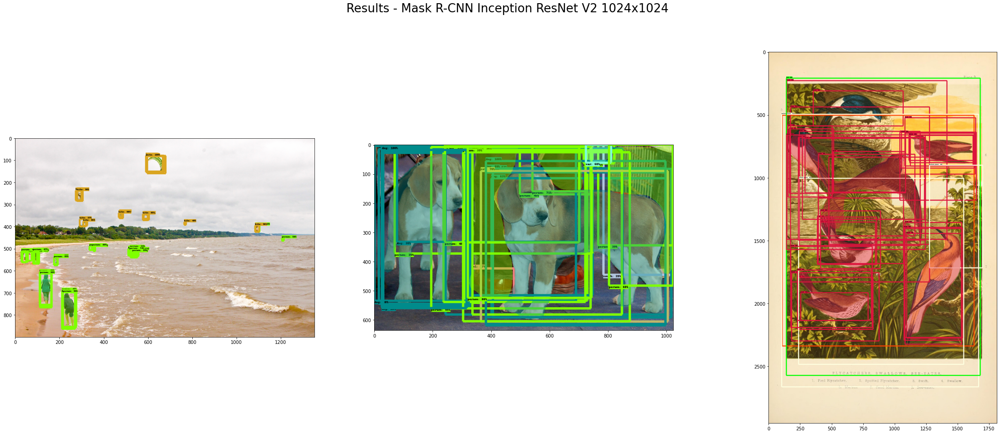

In [ ]:
# Show results - EfficientDet D0 512 x 512:
handle_models_with_masks_showResults(results_MaskRCNN, 'Results - Mask R-CNN Inception ResNet V2 1024x1024')

## ToDo : Custo computacional (30pt)

Compute o custo computacional (tempo de inferência) de cada modelo acima

Dica : Use o método "default_timer" da biblioteca "timeit"

In [ ]:
#exemplo de uso da timeit
#import timeit
#inicio = timeit.default_timer()
#alguma_funcao()
#fim = timeit.default_timer()
custo_MaskRCNN
print ('duracao EfficientDet: %f' % (custo_EfficientDet))
print ('duracao MobileNett: %f' % (custo_MobileNet))
print ('duracao RetinaNet50: %f' % (custo_RetinaNet50))
print ('duracao FasterRCNN: %f' % (custo_FasterRCNN))
print ('duracao MaskRCNN: %f' % (custo_MaskRCNN))

duracao EfficientDet: 8.812251
duracao MobileNett: 5.187783
duracao RetinaNet50: 14.991166
duracao FasterRCNN: 17.331836
duracao MaskRCNN: 184.787786


## ToDo : YoloV3 (30pt)



(Obs.: arquivo Yolov3.ipynb alterado em Cópia Yolov3.ipynb)

Carregue o YoloV3 pré-treinado (ver [link](https://github.com/christienatashiaarchie/YOLOv3-Object-Detection/blob/master/Yolov3.ipynb)) e execute a inferência nas mesmas imagens testadas com os modelos acima. Calule o custo computacional e compare contra os modelos acima. Qual a sua conclusão? Justifique.

- Como exido abaixo, a execução com Yolov3 teve tempo de predição das 3 imagens entre os tempos da MobileNet e EfficientDet. O modelo é mais rápido que RetinaNet50 e FasterRCNN, porém a acurácia de detecção é inferior aquela do modelo EfficientDet, como notado para a imagem "Birds".

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
loading weights of convolution #0
loading weights of convolution #1
loading weights of convolution #2
loading weights of convolution #3
no convolution #4
loading weights of convolution #5
loading weights of convolution #6
loading weights of convolution #7
no convolution #8
loading weights of convolution #9
loading weights of convolution #10
no convolution #11
loading weights of convolution #12
loading weights of convolution #13
loading weights of convolution #14
no convolution #15
loading weights of convolution #16
loading weights of convolution #17
no convolution #18
loading weights of convolution #19
loading weights of convolution #20
no convolution #21
loading weights of convolution #22
loading weights of convolution #23
no convolution #24
loading weights of convolution #25
loading weights of convolution #26
no convolution #27
loading weights of convolut

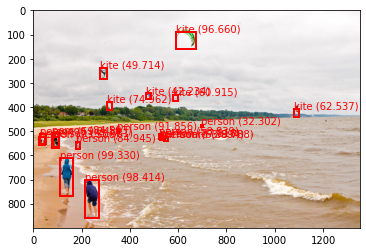

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
bird 68.14001798629761
bird 42.52178370952606
bird 33.68221819400787
bird 78.7354052066803


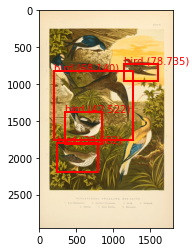

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
dog 99.77709650993347
dog 53.44458818435669
person 67.85314083099365
person 34.78761911392212
dog 99.95889663696289


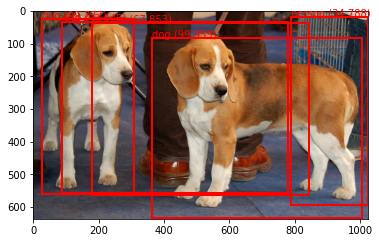


- duracao da execução com Yolov3: 6.497043
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


In [ ]:
%run '/content/gdrive/MyDrive/disciplinasDoutorado/PCC177-2022-1(Redes)/lab5/Cópia de Yolov3.ipynb'

## ToDo : Detectando objetos com dados próprios (Opcional / 20 Pontos Extra)


Caso você queira usar as técnicas de detecção de objetos em uma base de dados própria, siga o tutorial do [link](https://colab.research.google.com/github/luxonis/depthai-ml-training/blob/master/colab-notebooks/Easy_Object_Detection_With_Custom_Data_Demo_Training.ipynb). Você também pode se basear no no trabalho do [link](https://medium.com/swlh/tensorflow-2-object-detection-api-with-google-colab-b2af171e81cc).

Relate sua experiência e anexe aqui os resultados.

# Part II - Segmentação (40pt)




## ToDo : Rodando um tutorial (15pt)


Estude o tutorial do [link](https://www.tensorflow.org/tutorials/images/segmentation). Rode o código e veja o resultado. 


#### Código (cópia abaixo)

In [2]:
!pip install -q git+https://github.com/tensorflow/examples.git

    Running setup.py install for tensorflow-examples ... done
  DEPRECATION: tensorflow-examples was installed using the legacy 'setup.py install' method, because a wheel could not be built for it. A possible replacement is to fix the wheel build issue reported above. You can find discussion regarding this at https://github.com/pypa/pip/issues/8368.


In [5]:
try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf

In [6]:
#from __future__ import absolute_import, division, print_function, unicode_literals

from tensorflow_examples.models.pix2pix import pix2pix

import tensorflow_datasets as tfds
tfds.disable_progress_bar()

from IPython.display import clear_output
import matplotlib.pyplot as plt


In [7]:
dataset, info = tfds.load('oxford_iiit_pet:3.*.*', with_info=True)

Shuffling and writing examples to /root/tensorflow_datasets/oxford_iiit_pet/3.2.0.incompleteP0FHNZ/oxford_iiit_pet-train.tfrecord
Shuffling and writing examples to /root/tensorflow_datasets/oxford_iiit_pet/3.2.0.incompleteP0FHNZ/oxford_iiit_pet-test.tfrecord
Dataset oxford_iiit_pet downloaded and prepared to /root/tensorflow_datasets/oxford_iiit_pet/3.2.0. Subsequent calls will reuse this data.


In [8]:
def normalize(input_image, input_mask):
  input_image = tf.cast(input_image, tf.float32) / 255.0
  input_mask -= 1
  return input_image, input_mask

In [9]:
@tf.function
def load_image_train(datapoint):
  input_image = tf.image.resize(datapoint['image'], (128, 128))
  input_mask = tf.image.resize(datapoint['segmentation_mask'], (128, 128))

  if tf.random.uniform(()) > 0.5:
    input_image = tf.image.flip_left_right(input_image)
    input_mask = tf.image.flip_left_right(input_mask)

  input_image, input_mask = normalize(input_image, input_mask)

  return input_image, input_mask

In [10]:
def load_image_test(datapoint):
  input_image = tf.image.resize(datapoint['image'], (128, 128))
  input_mask = tf.image.resize(datapoint['segmentation_mask'], (128, 128))

  input_image, input_mask = normalize(input_image, input_mask)

  return input_image, input_mask

In [11]:
TRAIN_LENGTH = info.splits['train'].num_examples
BATCH_SIZE = 64
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
TRAIN_LENGTH, STEPS_PER_EPOCH

(3680, 57)

In [12]:
train = dataset['train'].map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
test = dataset['test'].map(load_image_test)

In [13]:
train_dataset = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
test_dataset = test.batch(BATCH_SIZE)

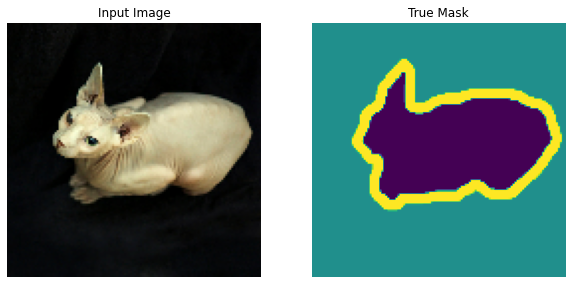

In [14]:
def display(display_list):
  plt.figure(figsize=(10, 10))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()

for image, mask in train.take(1):
  sample_image, sample_mask = image, mask
display([sample_image, sample_mask])


In [15]:
OUTPUT_CHANNELS = 3
base_model = tf.keras.applications.MobileNetV2(input_shape=[128, 128, 3], include_top=False)

# Use as ativações dessas camadas
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
layers = [base_model.get_layer(name).output for name in layer_names]

# Crie o modelo de extração de características
down_stack = tf.keras.Model(inputs=base_model.input, outputs=layers)

down_stack.trainable = False


9420800/9406464 [==============================] - 0s 0us/step


In [16]:
up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
]

In [17]:
def unet_model(output_channels):

  # Esta é a última camada do modelo
  last = tf.keras.layers.Conv2DTranspose(
      output_channels, 3, strides=2,
      padding='same', activation='softmax')  #64x64 -> 128x128

  inputs = tf.keras.layers.Input(shape=[128, 128, 3])
  x = inputs

  # Downsampling através do modelo
  skips = down_stack(x)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling e estabelecimento das conexões de salto
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [18]:
model = unet_model(OUTPUT_CHANNELS)
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
 

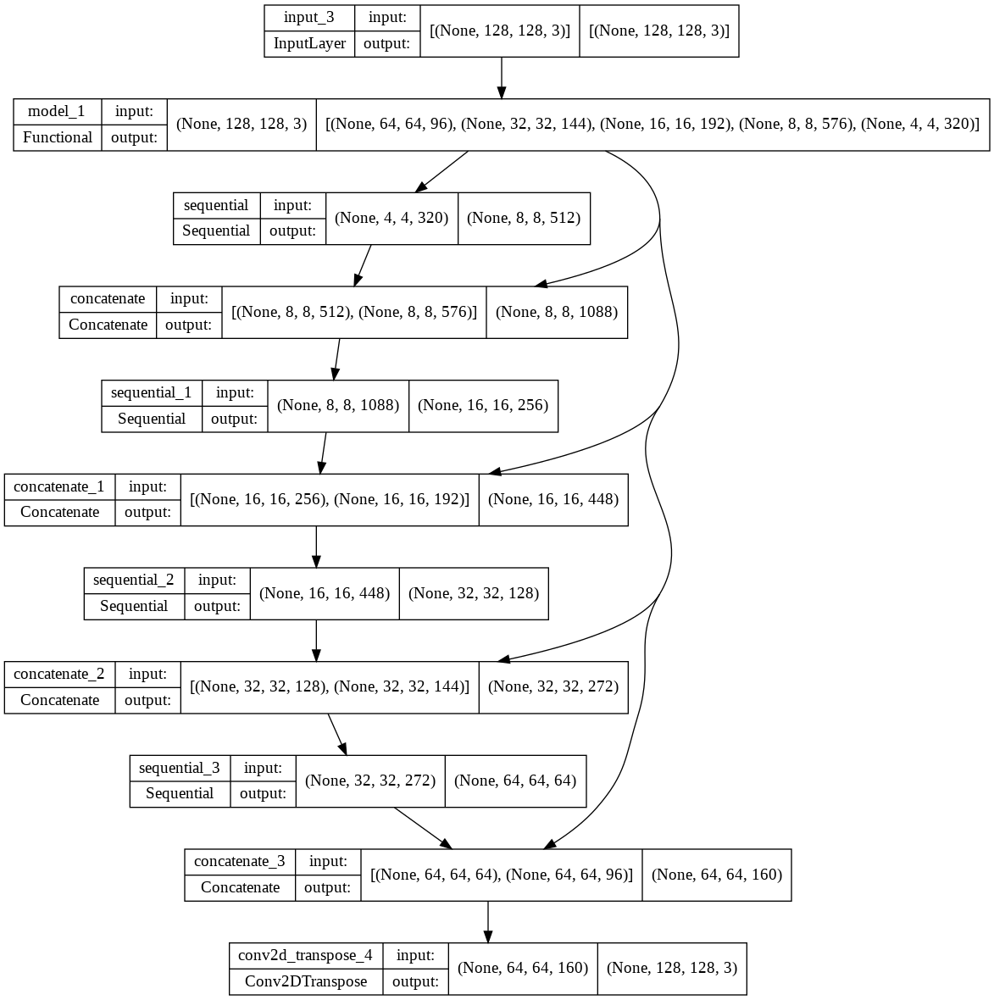

In [ ]:
tf.keras.utils.plot_model(model, show_shapes=True)

In [27]:
def create_mask(pred_mask):
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]

In [26]:
def show_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)])
  else:
    display([sample_image, sample_mask,
             create_mask(model.predict(sample_image[tf.newaxis, ...]))])

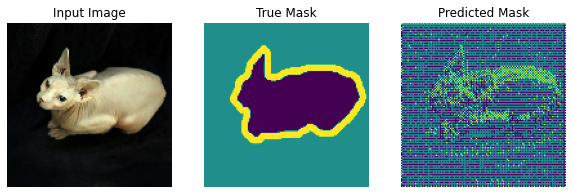

In [28]:
show_predictions()

In [35]:
class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    clear_output(wait=True)
    show_predictions()
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))


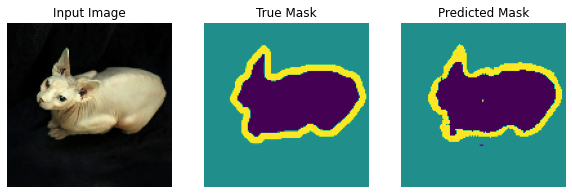


Sample Prediction after epoch 20

57/57 [==============================] - 9s 161ms/step - loss: 0.1322 - accuracy: 0.9395 - val_loss: 0.3202 - val_accuracy: 0.8915


In [ ]:
EPOCHS = 20
VAL_SUBSPLITS = 5
VALIDATION_STEPS = info.splits['test'].num_examples//BATCH_SIZE//VAL_SUBSPLITS

model_history = model.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_dataset,
                          callbacks=[DisplayCallback()])


## ToDo : Melhorando o modelo (25pt)

Use das operações que você conhece para construir uma rede melhor:
- Dropout
- Convolution2D, Dense, (várias funções de ativação como GeLu, LeakyReLu, etc)
- Flatten, GlobalAveragePooling2D, GlobalMaxPooling2D, etc.
- Use outras arquiteturas para o encoder:  inception, Xception, VGG16, EfficientNet


**Comentários sobre as tentativas de melhorias ao modelo: (Daniela)**  

* Primeira tentativa: foram extraídas camadas de modelos pré-treinados das arquiteturas VGG16, VGG19 e EfficientNetB0. Nas camadas de upsample, foi inserido dropout e normalizção em lotes para algumas camadas, com pesos inicializados com GLurotUniform. Nas tentativas de ajuste foram congeladas as camadas dessas arquiteturas, com treinamento por 30 épocas. Em seguida, feito com taxa de aprendizagem de 0.0001 e 0.00005 com otimizador ADAM. Esses modelos não superaram a acurácia do modelo proposto anteior (0.93). 

* Segunda tentativa: foram usadas as camadas de downsample do pix2pix, com pequenas alterações, treinando toda a rede por 40 épocas. Após 20 épocas com ADAM e LR de 0.0001, o treinamento continuou por 10 épocas com LR/10 (RMSprop), e por fim, novamente com uma LR/10 também durante 10 épocas. Em 40 épocas a acurácia alcançada no treino foi de 0.9395, igual ao modelo MobileNet treinado em 20 épocas. 

A conclusão é que melhoria ao modelo original poderiam ter alcançado uma acurácia superior nos testes. 

A última seção traz o gráfico de treinamento das ultimas épocas, sem melhoria, e teste com 5 imagens da base para o medelo a U-NET treinada por 40 épocas e LR decrescente.



In [29]:
# Função Upsample de pix2pix(https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py)
# com algumas modificações 

def upsample(filters, size, batchnorm=False, apply_dropout=False):
  """Upsamples an input.
  Conv2DTranspose => batchnorm => Dropout => LeakyRelu
  Args:
    filters: number of filters
    size: filter size
    batchnorm: True or False.
    apply_dropout: If True, adds the dropout layer
  Returns:
    Upsample Sequential Model
  """

  initializer = tf.keras.initializers.GlorotUniform() # ao invés de tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))

  if batchnorm:
    result.add(tf.keras.layers.BatchNormalization())  # apenas BatchNorm
 
  if apply_dropout:
    result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.LeakyReLU(alpha=0.1))  # alpha de 0.3 para 0.1
  return result
  

In [30]:
# Alterações ao modelo:
 
 #   - Comentadas as camdadas extraídas dos modelos pré-treinados 
   
OUTPUT_CHANNELS = 3
#base_model = tf.keras.applications.VGG19(input_shape=[128, 128, 3], include_top=False)
 
# Uso das ativações das camadas abaixo:
#layer_names = [
#    'block1a_dwconv',   # 64x64
#    'block2a_dwconv',   # 32x32
#    'block3b_dwconv',   # 16x16
#    'block4c_dwconv',   # 8x8
#    'block6a_project_conv',    # 4x4
#]

#layer_names = [
#     'block2_conv2',   # 64x64
#     'block3_conv4',   # 32x32
#     'block4_conv4',   # 16x16
#     'block5_conv4',   # 8x8
#     'block5_pool',    # 4x4
#]

#layers = [base_model.get_layer(name).output for name in layer_names]

# Crie o modelo de extração de características
#down_stack = tf.keras.Model(inputs=base_model.input, outputs=layers)
#down_stack.trainable = False

 
#up_stack = [
#   upsample(512, 3, batchnorm = True),  # 4x4 -> 8x8
#   upsample(256, 3),  # 8x8 -> 16x16
#   upsample(128, 3, apply_dropout=True),  # 16x16 -> 32x32
#   upsample(64, 3),   # 32x32 -> 64x64
#]
#tf.keras.utils.plot_model(base_model, show_shapes=True)

In [31]:
def unet_generator(output_channels, batchnorm = False):
  """Modified u-net generator model (https://arxiv.org/abs/1611.07004).
  Args:
    output_channels: Output channels
    norm_type: Type of normalization. Either 'batchnorm' or 'instancenorm'.
  Returns:
    Generator model
  """  
 
  down_stack = [
      pix2pix.downsample(128, 4, apply_norm=False),  # (bs, 64, 64, 128)
      pix2pix.downsample(256, 4, apply_norm=False),  # (bs, 32, 32, 256)
      pix2pix.downsample(512, 4, apply_norm=False),  # (bs, 16, 16, 512)
      pix2pix.downsample(512, 4),  # (bs, 8, 8, 512)
      pix2pix.downsample(512, 4),  # (bs, 4, 4, 512)
      pix2pix.downsample(512, 4),  # (bs, 2, 2, 512)
      pix2pix.downsample(512, 4),  # (bs, 1, 1, 512)
  ]

  up_stack = [
      upsample(512, 4, batchnorm=True, apply_dropout=True),  # (bs, 2, 2, 1024)
      upsample(512, 4, batchnorm=True, apply_dropout=True),  # (bs, 4, 4, 1024)
      upsample(512, 4, batchnorm=True, apply_dropout=True),  # (bs, 8, 8, 1024)
      upsample(512, 4),  # (bs, 16, 16, 1024)
      upsample(256, 4),  # (bs, 32, 32, 512)
      upsample(128, 4),  # (bs, 64, 64, 256)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(
      output_channels, 4, strides=2,
      padding='same', kernel_initializer=initializer,
      activation='tanh')  # (bs, 256, 256, 3)

  concat = tf.keras.layers.Concatenate()

  inputs = tf.keras.layers.Input(shape=[None, None, 3])
  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = concat([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

"\ndef unet_model(output_channels):\n\n  # Esta é a última camada do modelo\n  last = tf.keras.layers.Conv2DTranspose(\n      output_channels, 3, strides=2,\n      padding='same', activation='softmax')  #64x64 -> 128x128\n\n  inputs = tf.keras.layers.Input(shape=[128, 128, 3])\n  x = inputs\n\n  # Downsampling através do modelo\n  skips = down_stack(x)\n  x = skips[-1]\n  skips = reversed(skips[:-1])\n\n  # Upsampling e estabelecimento das conexões de salto\n  for up, skip in zip(up_stack, skips):\n    x = up(x)\n    concat = tf.keras.layers.Concatenate()\n    x = concat([x, skip])\n\n  x = last(x)\n\n  return tf.keras.Model(inputs=inputs, outputs=x)"

In [32]:

OUTPUT_CHANNELS = 3
model = unet_model(OUTPUT_CHANNELS)
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999), loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])      # Otimizador ADAM com LR/10
 

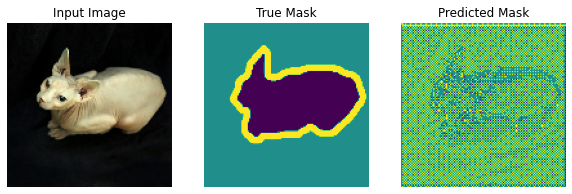

In [33]:
show_predictions()

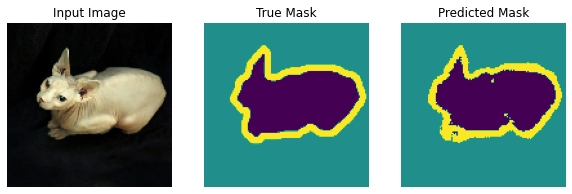


Sample Prediction after epoch 20

57/57 [==============================] - 336s 6s/step - loss: 0.1661 - accuracy: 0.9297 - val_loss: 0.2985 - val_accuracy: 0.8854


In [36]:
EPOCHS = 20
VAL_SUBSPLITS = 5
VALIDATION_STEPS = info.splits['test'].num_examples//BATCH_SIZE//VAL_SUBSPLITS

model_history = model.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_dataset,
                          callbacks=[DisplayCallback()])

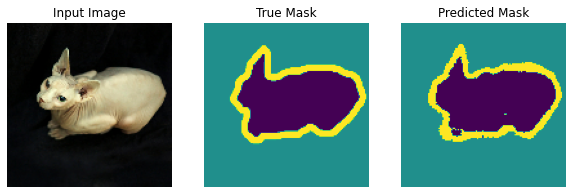


Sample Prediction after epoch 30

57/57 [==============================] - 329s 6s/step - loss: 0.1434 - accuracy: 0.9383 - val_loss: 0.3108 - val_accuracy: 0.8850


In [39]:
# Continuação do treino (+ 10 épocas e LR/10)

model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              optimizer = tf.keras.optimizers.RMSprop(learning_rate= 0.00001),
              metrics=['accuracy'])

fine_tune_epochs = 10
total_epochs =  EPOCHS + fine_tune_epochs

history_fine = model.fit(train_dataset, epochs=total_epochs,
                          initial_epoch=model_history.epoch[-1],
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_dataset,
                          callbacks=[DisplayCallback()])


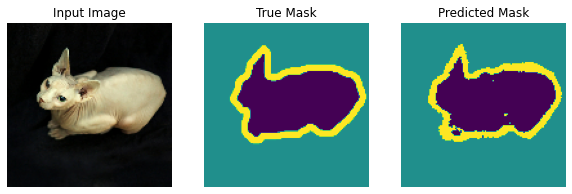


Sample Prediction after epoch 40

57/57 [==============================] - 360s 6s/step - loss: 0.1401 - accuracy: 0.9395 - val_loss: 0.3135 - val_accuracy: 0.8844


In [44]:
# Treinando por +10 épocas com LR/10 = 0.000001

model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              optimizer = tf.keras.optimizers.RMSprop(learning_rate= 0.000001),
              metrics=['accuracy'])

fine_tune_epochs = 10
total_epochs =  EPOCHS + fine_tune_epochs *2 

history_fine2 = model.fit(train_dataset, epochs=total_epochs,
                          initial_epoch=history_fine.epoch[-1],
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_dataset,
                          callbacks=[DisplayCallback()])

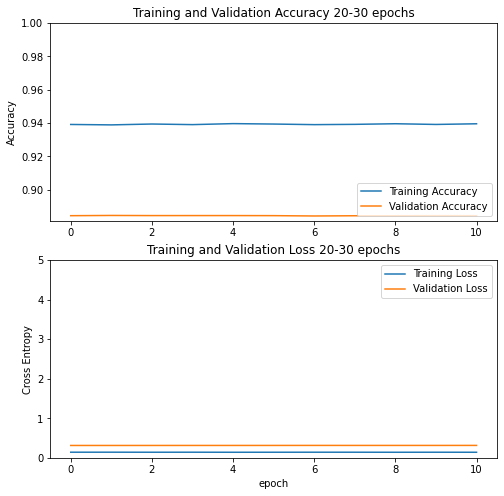

In [54]:
# 7. Plote os gráficos de custo do treino e validação
acc = history_fine2.history['accuracy'] 
val_acc = history_fine2.history['val_accuracy']
loss = history_fine2.history['loss']
val_loss = history_fine2.history['val_loss']
 

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy 20-30 epochs')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,5.0])
plt.title('Training and Validation Loss 20-30 epochs')
plt.xlabel('epoch')
plt.show()

 

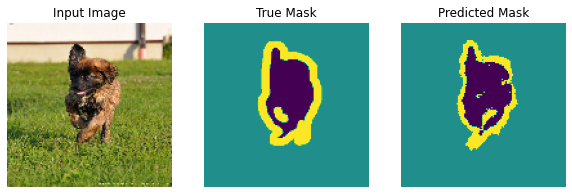

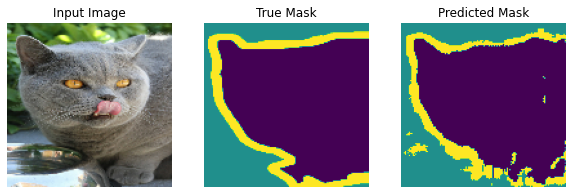

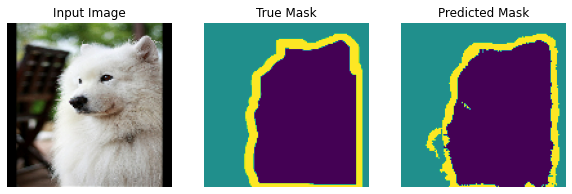

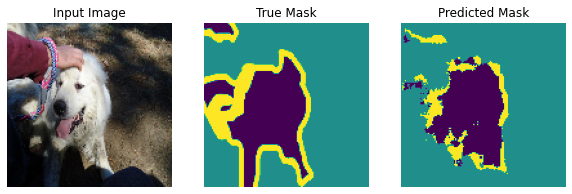

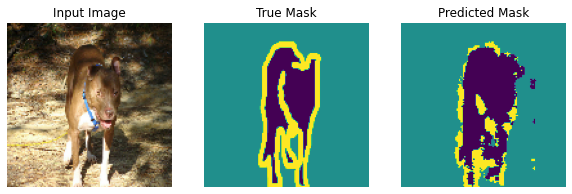

In [56]:
# Predição de 20 imagens da base de testes:

for image, mask in test_dataset.take(5):
      pred_mask = model.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)])